# Load packages

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import scipy as sp
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_score
import os

# Load MERFISH object

In [27]:
adata_merfish = sc.read_h5ad('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15.h5ad')

In [30]:
adata_merfish.obs['celltype'].value_counts()

Compact-LV           30380
aCM-RA               19947
Proliferating vCM    17584
vFibro               16624
Trabecular-LV        16511
VE                   12248
VIC                  11596
vEndocardial         10887
aCM-LA               10441
Compact-RV            9488
EPDC                  8540
Trabecular-RV         8052
aFibro                7417
avCM-LV               7348
avCM-RV               5845
Pericyte              5458
His-Purkinje          5429
VSMC                  4673
aEndocardial          4599
VEC                   3726
Epicardial            2356
AVN-like              2292
IFT-like              2027
adFibro               1562
LEC                   1292
WBC                   1286
Neuronal-like         1027
Name: celltype, dtype: int64

# Community identification

## Calculate 'zone' cell type counts

In [31]:
celltype_key = 'celltype'
# for radius in [25,50,75,100,125,150,175,200,225,250,275,300]:
for radius in [100,125,150,175,200,225,250,275,300]:
# for radius in [150]:
    print(radius)
    
    # sample = 'R77_4C4'
    for sample in ['R77_4C4','R78_4C12','R78_4C15']:
        print(sample)

        # subset to a section, find
        adata_merfish_section = adata_merfish[adata_merfish.obs['sample_id']==sample]
        # find the neighboring cells in the 'zone' around each cell
        point_tree = sp.spatial.cKDTree(adata_merfish_section.obsm['spatial'])
        neigh_inds_list = point_tree.query_ball_point(adata_merfish_section.obsm['spatial'], radius)
        neigh_celltype_df = pd.DataFrame(adata_merfish_section.obs[celltype_key][neigh_inds_list[0]].value_counts())
            
        # quantify the proportion of cell type in each zone
        neigh_celltype_list = []
        for i in tqdm(range(len(neigh_inds_list))):
            neigh_inds = neigh_inds_list[i]
            celltype_counts = pd.DataFrame(adata_merfish_section.obs[celltype_key][neigh_inds].value_counts())
            neigh_celltype_list.append(celltype_counts)
        neigh_celltype_df = pd.concat(neigh_celltype_list, axis=1)
            
        neigh_celltype_df.columns = adata_merfish_section.obs.index
        neigh_celltype_df = neigh_celltype_df.T
        
        neigh_celltype_df = neigh_celltype_df.fillna(0.0).astype('int')
    
        # write 'zone' cell type counts to file
        neigh_celltype_df.to_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/' + sample + '/merfish_neigh_' + celltype_key +'_counts_radius_' + str(radius) + '.csv')

100
R77_4C4


100%|██████████| 72962/72962 [01:12<00:00, 1007.33it/s]


R78_4C12


100%|██████████| 75782/75782 [01:15<00:00, 1006.91it/s]


R78_4C15


100%|██████████| 79891/79891 [01:18<00:00, 1014.18it/s]


125
R77_4C4


100%|██████████| 72962/72962 [01:13<00:00, 990.21it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:16<00:00, 992.84it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:20<00:00, 993.34it/s] 


150
R77_4C4


100%|██████████| 72962/72962 [01:13<00:00, 991.35it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:16<00:00, 984.74it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:20<00:00, 998.07it/s] 


175
R77_4C4


100%|██████████| 72962/72962 [01:13<00:00, 998.66it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:16<00:00, 985.69it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:21<00:00, 979.32it/s] 


200
R77_4C4


  1%|          | 500/72962 [00:00<01:14, 966.66it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 79891/79891 [01:21<00:00, 974.62it/s] 


225
R77_4C4


100%|██████████| 72962/72962 [01:14<00:00, 983.74it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:18<00:00, 965.58it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:22<00:00, 966.50it/s] 


250
R77_4C4


100%|██████████| 72962/72962 [01:17<00:00, 943.14it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:20<00:00, 942.83it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:24<00:00, 942.78it/s] 


275
R77_4C4


100%|██████████| 72962/72962 [01:19<00:00, 912.85it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:21<00:00, 931.11it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:29<00:00, 889.11it/s] 


300
R77_4C4


100%|██████████| 72962/72962 [01:20<00:00, 905.02it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:25<00:00, 889.10it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:28<00:00, 899.76it/s] 


## Cluster 'zones'

In [3]:
radius = 150
celltype_key = 'celltype'

# Read in 'zone' cell type counts for each section
neigh_celltype_df = pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R77_4C4/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0)
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C12/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C15/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))

# Scale cell type counts for each 'zone'
neigh_celltype_df = pd.DataFrame(StandardScaler().fit_transform(neigh_celltype_df),
                                 index = neigh_celltype_df.index,
                                 columns = neigh_celltype_df.columns)

neigh_celltype_df.columns = neigh_celltype_df.columns.astype(str)

In [4]:
# K-means cluster 'zone' cell type proportions
k = 13
kmeans = KMeans(n_clusters=k, random_state=0).fit(neigh_celltype_df)

adata_merfish.obs.loc[neigh_celltype_df.index,'zone_cluster'] = kmeans.labels_.astype('str')

... storing 'zone_cluster' as categorical


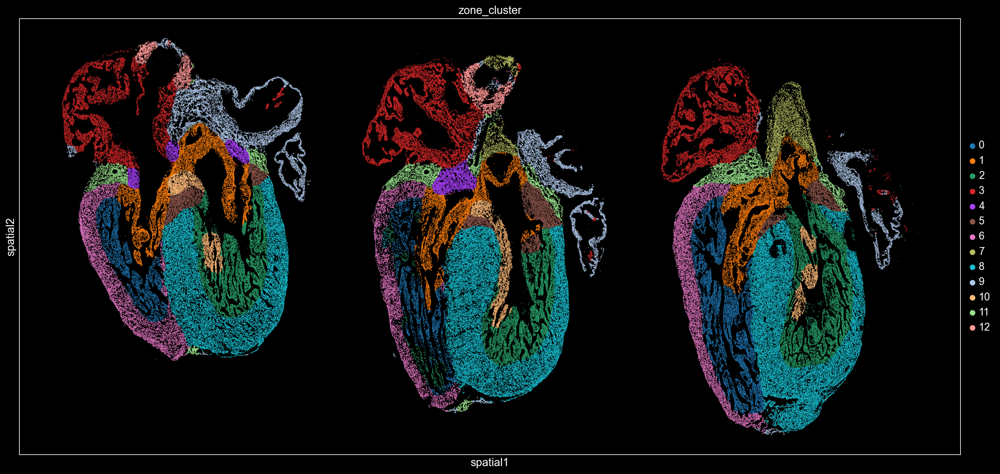

In [5]:
# Plot zone clusters spatially
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish, basis="spatial", color="zone_cluster", size=3)
plt.style.use('default')

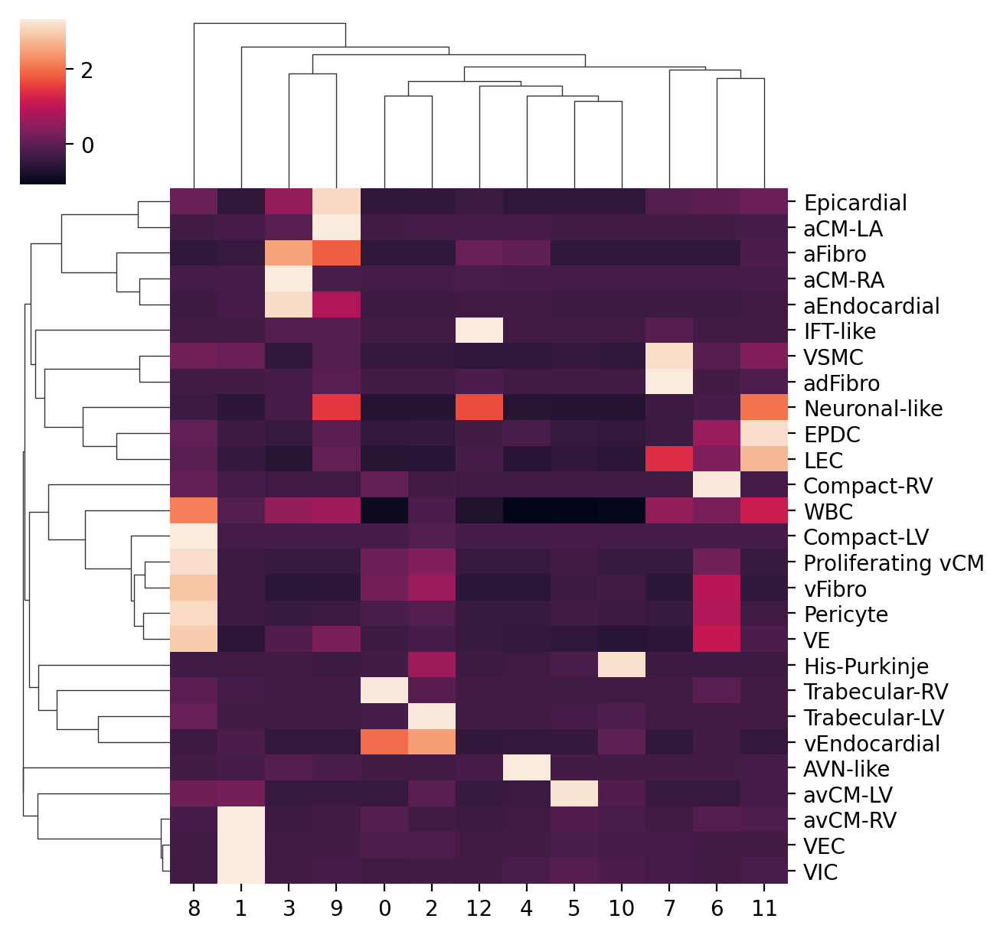

In [6]:
# Generate a heatmap to visualize the cell type contribution for each cluster
df = adata_merfish.obs.groupby([celltype_key,'zone_cluster']).size().unstack(fill_value=0).to_numpy()
plot_df = pd.DataFrame(df, 
                       index=adata_merfish.obs[celltype_key].cat.categories, 
                       columns=adata_merfish.obs['zone_cluster'].cat.categories)
plot_df_norm_row = plot_df.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
g = sns.clustermap(plot_df_norm_row)
g.fig.set_size_inches(6,6)

## Annotate clusters

In [13]:
# annotate clusters (CHANGE CLUSTER MAPPING)
# spatial_cluster_annotations = {'0':'Trabecular-RV', '1':'Compact-LV/IVS', '2':'Subepicardial', '3':'Right Atria', 
#                                '4':'Trabecular-LV', '5':'His-Purkinje', '6':'Valve', '7':'Left Atria', 
#                                '8':'OFT-adFibro', '9':'Compact-RV', '10':'SAN/IFT', '11':'AVC', '12':'Grt. Art.-VSMC'}
zone_cluster_annotations = {'0':'Trabecular-RV', '1':'Valve', '2':'Trabecular-LV', '3':'Right Atria', 
                           '4':'AVC', '5':'Papillary Muscle-LV', '6':'Compact-RV', '7':'OFT', 
                           '8':'Compact-LV/IVS', '9':'Left Atria', '10':'His-Purkinje', '11':'Subepicardial', '12':'SAN/IFT'}
adata_merfish.obs['communities'] = adata_merfish.obs['zone_cluster'].replace(zone_cluster_annotations)

In [50]:
# adata_merfish_filtered.write('/volume/Data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15_filtered_spatial_communities_v2.h5ad')
# adata_merfish = sc.read_h5ad('/volume/Data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15_filtered_spatial_communities_v2.h5ad')

In [22]:
adata_merfish.uns['spatial_communities_colors'] = ['#007ABA','#F37121','#FBB36E','#8B58A4','#E91E25',
                                                   '#925047','#F58D93','#B4BE50','#DF75AE','#00A163',
                                                   '#00B7CA','#A8C7E9','#8CCA7C']

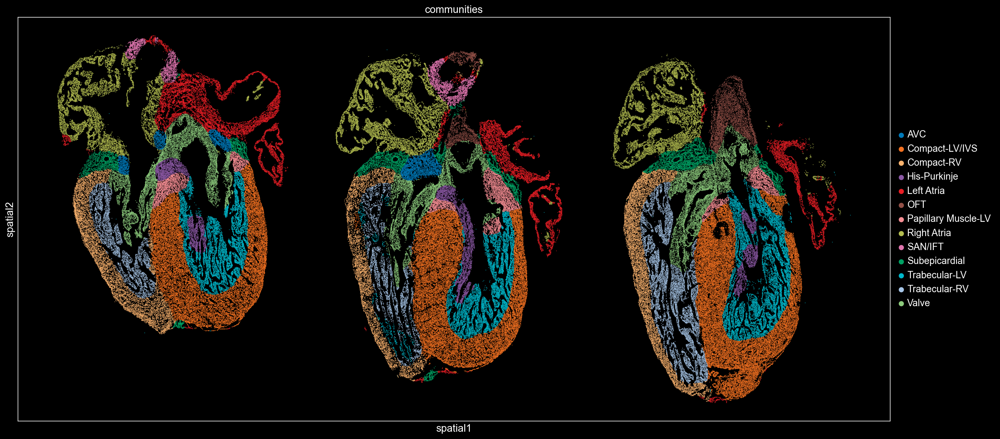

In [23]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish, basis="spatial", color="communities", size=3)
plt.style.use('default')

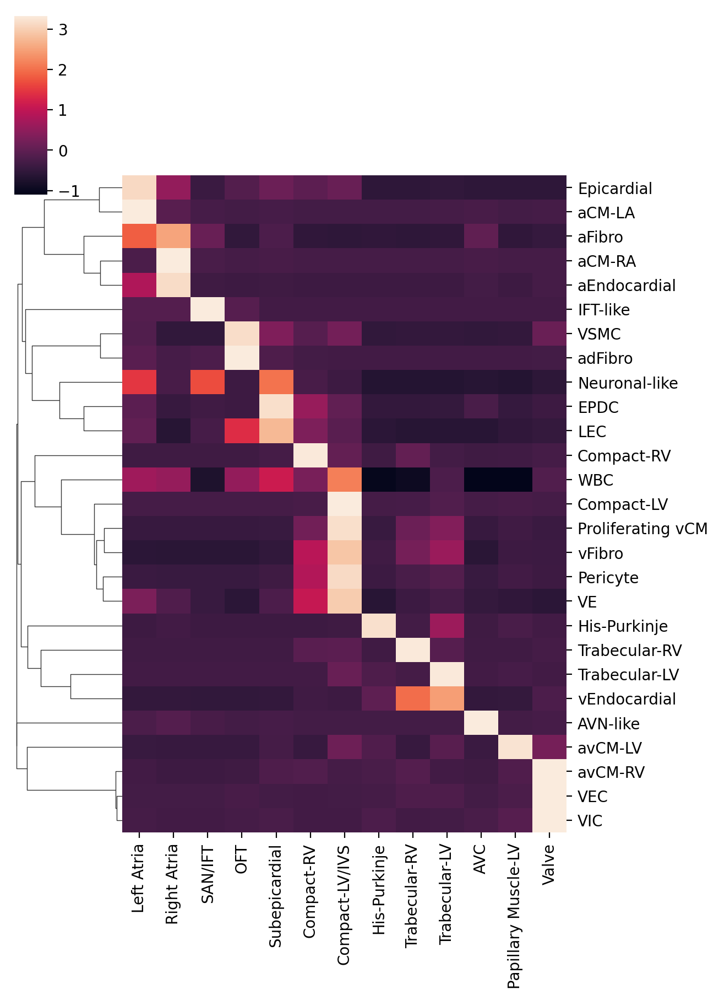

In [16]:
celltype_key = 'celltype'
df = adata_merfish.obs.groupby([celltype_key,'communities']).size().unstack(fill_value=0).to_numpy()
plot_df = pd.DataFrame(df, 
                       index=adata_merfish.obs[celltype_key].cat.categories, 
                       columns=adata_merfish.obs['communities'].cat.categories)
com_order = ['Left Atria','Right Atria','SAN/IFT','OFT','Subepicardial','Compact-RV',
             'Compact-LV/IVS','His-Purkinje','Trabecular-RV','Trabecular-LV','AVC',
             'Papillary Muscle-LV','Valve']
plot_df = plot_df.loc[:,com_order]
plot_df_norm_row = plot_df.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
g = sns.clustermap(plot_df_norm_row, col_cluster=False)
g.fig.set_size_inches(6,9)
# g.savefig('/volume/Plots/MERFISH/spatial_cluster/w12/neigh_celltype/celltype2_v2/radius_' + str(radius) + '/k_' + str(k) + 'spatial_community_heatmap.pdf', bbox_inches='tight')

# Spatial metrics

## Complexity

Complexity is the number of unique cell types in the 'zone' around each cell.

In [17]:
radius = 150
celltype_key = 'celltype'

# Read in 'zone' cell type counts for each section
neigh_celltype_df = pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R77_4C4/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0)
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C12/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C15/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))

neigh_celltype_df.columns = neigh_celltype_df.columns.astype(str)

# Calculate 'zone' complixities
neigh_celltype_df['complexity'] = neigh_celltype_df.astype(bool).sum(axis=1)
adata_merfish.obs['complexity'] = neigh_celltype_df.loc[adata_merfish.obs.index,'complexity']

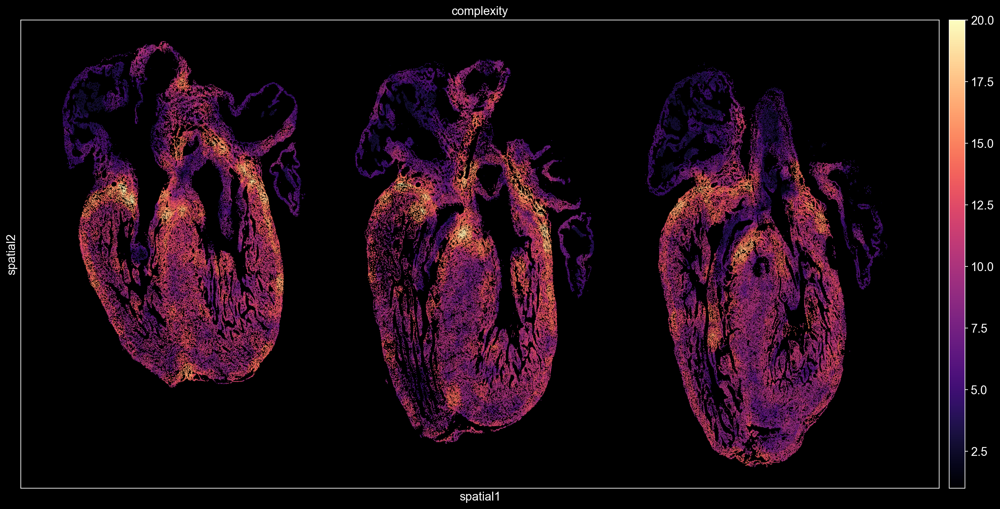

In [19]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish, basis="spatial", color="complexity", size=3, color_map='magma')
plt.style.use('default')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(0, 0, 'Subepicardial'),
  Text(1, 0, 'Papillary Muscle-LV'),
  Text(2, 0, 'AVC'),
  Text(3, 0, 'Compact-RV'),
  Text(4, 0, 'SAN/IFT'),
  Text(5, 0, 'His-Purkinje'),
  Text(6, 0, 'Trabecular-LV'),
  Text(7, 0, 'Compact-LV/IVS'),
  Text(8, 0, 'Trabecular-RV'),
  Text(9, 0, 'Valve'),
  Text(10, 0, 'Left Atria'),
  Text(11, 0, 'OFT'),
  Text(12, 0, 'Right Atria')])

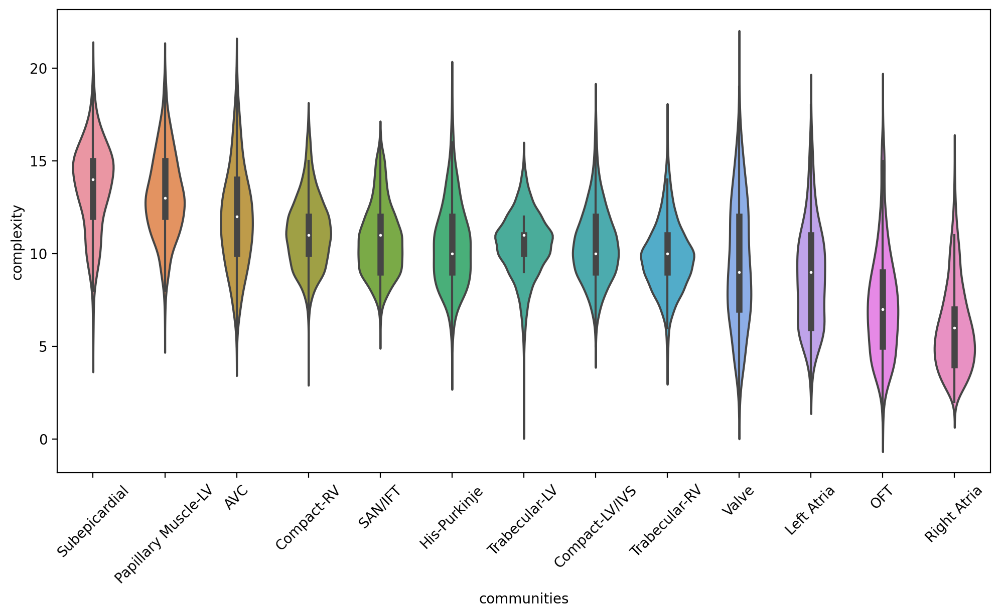

In [23]:
data = adata_merfish.obs.loc[:,['communities','complexity']]

com_order = data.groupby(['communities'])['complexity'].mean().reset_index().sort_values('complexity', ascending=False)['communities'].to_list()
data['communities'] = pd.Categorical(data['communities'], categories=com_order)

plt.figure(figsize = (12,6))
sns.violinplot(x="communities", y="complexity", data=data, bw=.3)
plt.xticks(rotation=45)
# plt.savefig('/volume/Plots/MERFISH/spatial_metrics/community_complexity_vlnplot_radius_' + str(radius) + '.pdf', bbox_inches='tight')